In [110]:
import os

import matplotlib as mpl
import numpy as np
import pandas as pd
import seaborn as sns
import simplstyles
from himalaya.backend import set_backend
from matplotlib import pyplot as plt
from voxelwise_tutorials.io import load_hdf5_array
from voxelwise_tutorials.viz import plot_flatmap_from_mapper, plot_2d_flatmap_from_mapper

from results import get_result_path

In [111]:
plt.style.use('nord-light-talk')
data_dir = "../../data"
backend = set_backend('torch_cuda', on_error='warn')
simplstyles.styles['nord-light-talk']

/home/leo/PycharmProjects/compare_variance_residual/venv/lib/python3.12/site-packages/himalaya/backend/_utils.py:55: UserWarning: Setting backend to torch_cuda failed: PyTorch not installed..Falling back to numpy backend.
  warnings.warn(f"Setting backend to {backend} failed: {str(error)}."


RcParams({'axes.axisbelow': True,
          'axes.edgecolor': '#abb9cf',
          'axes.facecolor': 'white',
          'axes.grid': False,
          'axes.labelcolor': '#434c5e',
          'axes.labelsize': 18.0,
          'axes.linewidth': 1.25,
          'axes.prop_cycle': cycler('color', ['#5e81ac', '#88c0d0', '#d08770', '#bf616a', '#b48ead', '#a3be8c', '#ebcb8b', '#abb9cf']),
          'axes.spines.right': False,
          'axes.spines.top': False,
          'axes.titlelocation': 'left',
          'axes.titlesize': 18.0,
          'axes.titleweight': 'bold',
          'boxplot.showbox': False,
          'boxplot.showcaps': False,
          'boxplot.showfliers': False,
          'figure.facecolor': 'white',
          'font.family': ['sans-serif'],
          'font.sans-serif': ['Inter',
                              'Helvetica',
                              'Arial',
                              'DejaVu Sans',
                              'Bitstream Vera Sans',
                   

In [112]:
subject = 5
modality = "listening"
low_level_feature = "powspec"

In [113]:
mapper_path = os.path.join("../../data", 'mappers', f"subject{subject:02}_mappers.hdf")
flatmap_mask = load_hdf5_array(mapper_path, key='flatmap_mask')

# Load EV

In [114]:
ev_path = os.path.join(get_result_path(modality, subject), 'ev.csv')
ev = pd.read_csv(ev_path)
ev.describe()

,# ev
count,80069.000000
mean,0.036342
std,0.089727
min,-0.362716
25%,-0.022800
50%,0.027392
75%,0.082916
max,0.529447


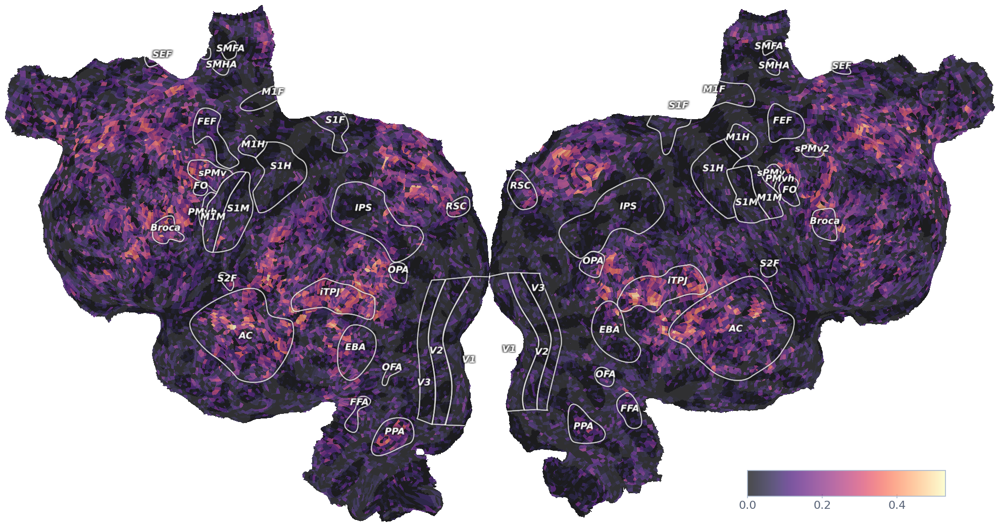

In [115]:
plot_flatmap_from_mapper(ev, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(ev), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

# Variance Partitioning

## Low Level Prediction

In [116]:
low_level_file = os.path.join(get_result_path(modality, subject), f"{low_level_feature}_scores.csv")

In [117]:
print(f"Loading {low_level_file}")
low_level_scores = pd.read_csv(low_level_file)
low_level_scores.describe()

Loading results/listening/subject05/powspec_scores.csv


,correlation_score,r2_score,p_value
count,80069.000000,8.061500e+04,8.006900e+04
mean,0.014218,3.424738e-04,4.627419e-01
std,0.069816,8.098314e-03,2.991420e-01
min,-0.251530,-1.207752e-01,2.958486e-27
25%,-0.031302,-1.192093e-07,1.937998e-01
50%,0.012259,0.000000e+00,4.512623e-01
75%,0.056087,1.192093e-07,7.209278e-01
max,0.577263,2.506031e-01,9.999950e-01


In [118]:
low_level_correlation = low_level_scores['correlation_score']
low_level_correlation = low_level_correlation.to_numpy()
low_level_correlation = np.nan_to_num(low_level_correlation)

# significant_voxels = [True if p_value < 0.05 else False for p_value in low_level_scores['p_value']]
# masked_correlation = np.full(low_level_correlation.shape, np.nan)
# # set values to nan, if not significant
# masked_correlation[significant_voxels] = low_level_correlation[significant_voxels]

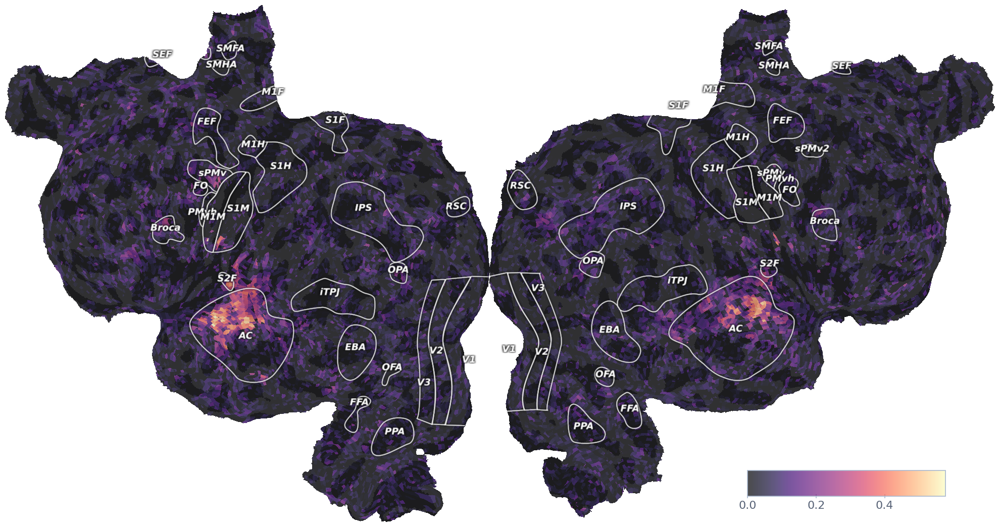

In [119]:
plot_flatmap_from_mapper(low_level_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(low_level_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

## Semantic Prediction

In [120]:
semantic_file = os.path.join(get_result_path(modality, subject), f"english1000_scores.csv")

In [121]:
semantic_scores = pd.read_csv(semantic_file)
semantic_scores.describe()

,correlation_score,r2_score,p_value
count,80069.000000,80615.000000,8.006900e+04
mean,0.032528,0.002698,3.885619e-01
std,0.093780,0.018098,3.156011e-01
min,-0.342366,-0.149125,2.423346e-24
25%,-0.029386,-0.000706,8.467027e-02
50%,0.022881,0.000000,3.407382e-01
75%,0.082632,0.001464,6.601029e-01
max,0.549349,0.229795,9.999886e-01


In [122]:
semantic_correlation = semantic_scores['correlation_score']
semantic_correlation = semantic_correlation.to_numpy()
semantic_correlation = np.nan_to_num(semantic_correlation)
vmax = semantic_correlation.max()
print(vmax)

0.5493486060535029


<Axes: >

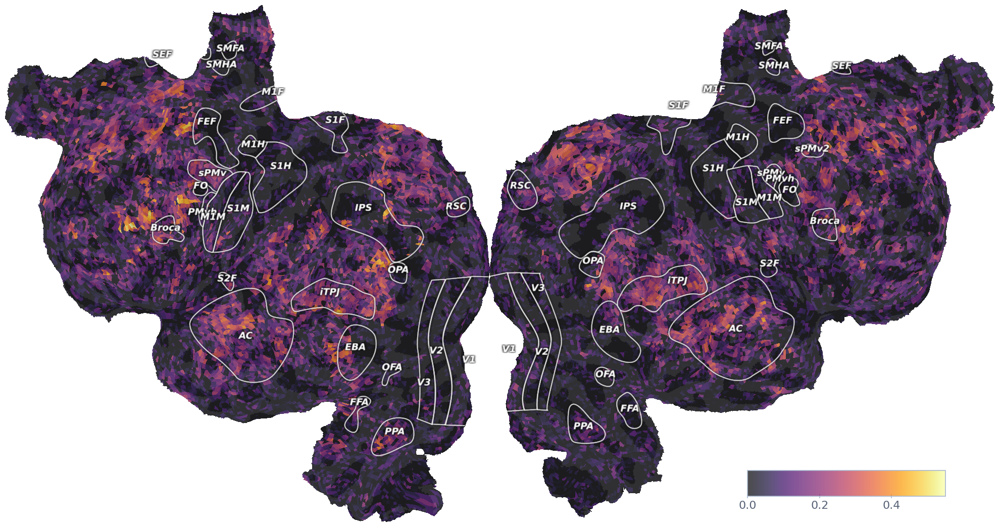

In [123]:
plot_flatmap_from_mapper(semantic_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=vmax, colorbar_location=[0.75, 0.05, 0.2, 0.05])


## Joint Prediction

In [124]:
joint_file = os.path.join(get_result_path(modality, subject), f"joint_english1000_{low_level_feature}_scores.csv")

In [125]:
joint_scores = pd.read_csv(joint_file)
joint_scores.describe()

,correlation_score,r2_score,p_value
count,80069.000000,80615.000000,8.006900e+04
mean,0.034549,0.002935,3.944338e-01
std,0.093991,0.019469,3.153766e-01
min,-0.324436,-0.136151,1.648104e-25
25%,-0.026956,-0.001615,9.127702e-02
50%,0.024025,0.000000,3.519168e-01
75%,0.082255,0.002164,6.667221e-01
max,0.560853,0.250502,9.999873e-01


In [126]:
joint_correlation = joint_scores['correlation_score']
joint_correlation = joint_correlation.to_numpy()
joint_correlation = np.nan_to_num(joint_correlation)

significant_voxels = [True if p_value < 0.05 else False for p_value in joint_scores['p_value']]
masked_correlation = np.full(joint_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[significant_voxels] = joint_correlation[significant_voxels]

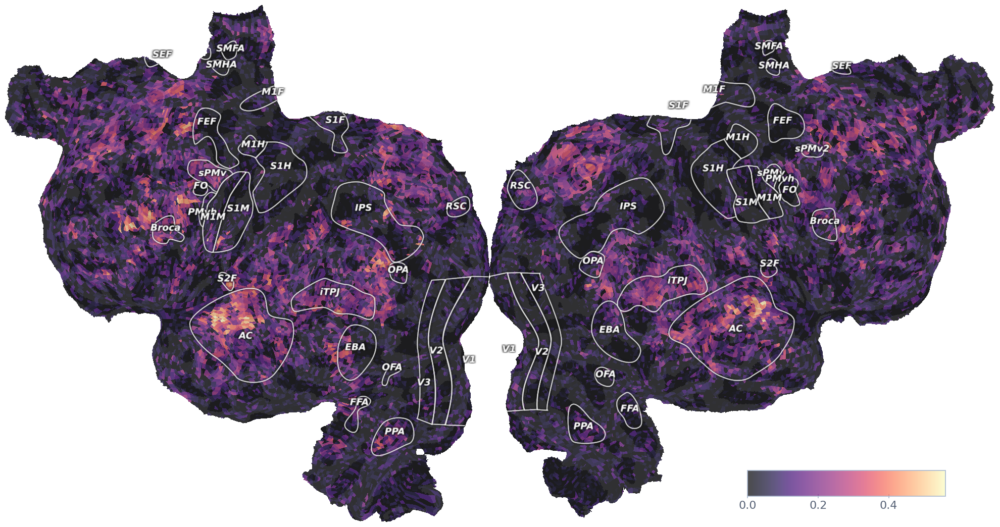

In [127]:
plot_flatmap_from_mapper(joint_correlation, mapper_path, vmin=0,
                         vmax=np.max(joint_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')

plt.show()

In [128]:
vp_path = os.path.join(get_result_path(modality, subject), f"vp_english1000_{low_level_feature}_scores.csv")

In [129]:
vp_scores = pd.read_csv(vp_path)
vp_scores.describe()

,semantic\powspec,joint\powspec,semantic\powspec_r2,joint\powspec_r2
count,80069.000000,80069.000000,8.061500e+04,80615.000000
mean,0.021899,0.021899,1.059476e-04,0.002592
std,0.095994,0.095994,4.572732e-03,0.017661
min,-0.312896,-0.312896,-6.519926e-02,-0.135224
25%,-0.043307,-0.043307,-1.192093e-07,-0.000662
50%,0.001035,0.001035,0.000000e+00,0.000000
75%,0.077499,0.077499,1.192093e-07,0.001410
max,0.508130,0.508130,1.376827e-01,0.229795


In [130]:
vp_correlation = vp_scores[f'semantic\\{low_level_feature}']
vp_correlation = np.array(vp_correlation)
# vp_correlation = semantic_minus_low_level

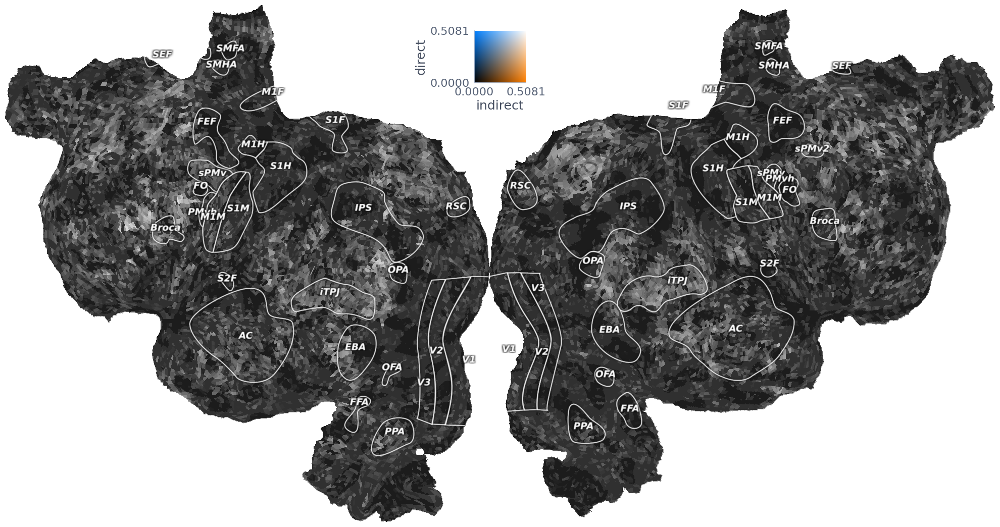

In [131]:
indirect = vp_scores[f'semantic\\{low_level_feature}']
direct = vp_scores[f'joint\\{low_level_feature}']
vmax = max(indirect.max(), direct.max())

plot_2d_flatmap_from_mapper(indirect, direct, mapper_path, vmin=0, vmin2=0, vmax=vmax, vmax2=vmax, label_1="indirect",
                            label_2='direct')
plt.show()

# Residual Method

In [132]:
cross_path = os.path.join(get_result_path(modality, subject), f"cross_{low_level_feature}_english1000_scores.csv")
cross_ridge_path = os.path.join(get_result_path(modality, subject),
                                f"cross_ridge_{low_level_feature}_english1000_scores.csv")

In [133]:
r2_scores = np.array(pd.read_csv(cross_path))
r2_scores_ridge = np.array(pd.read_csv(cross_ridge_path))

<Axes: ylabel='Count'>

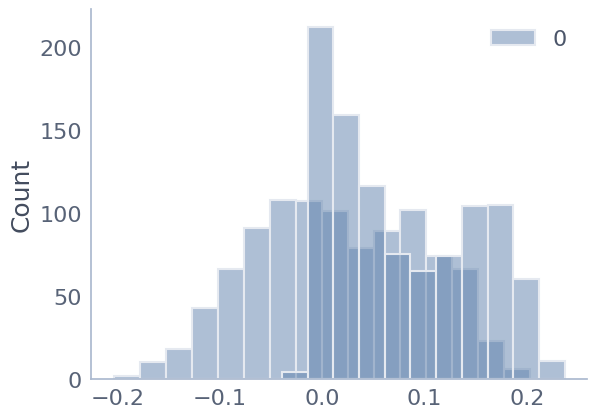

In [134]:
sns.histplot(r2_scores, label="OLS")
sns.histplot(r2_scores_ridge, label="Ridge")

In [135]:
means = [r2_scores.mean(), r2_scores_ridge.mean()]

Text(0.5, 0, 'powspec')

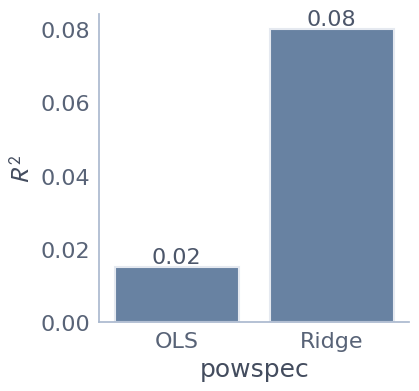

In [136]:
plt.subplots(figsize=(4, 4))
ax = sns.barplot(x=["OLS", "Ridge"], y=means)
for i in ax.containers:
    ax.bar_label(i, fmt='%.2f')
# plt.ylim([0, 1.01])

plt.ylabel(r"$R^2$")
plt.xlabel(low_level_feature)

## Residuals

### OLS

In [137]:
residual_file = os.path.join(get_result_path(modality, subject), f"residual_{low_level_feature}_english1000_scores.csv")

In [138]:
residual_scores = pd.read_csv(residual_file)
residual_scores.describe()

,Unnamed: 0,correlation_score,r2_score,p_value
count,80615.000000,80069.000000,80615.000000,8.006900e+04
mean,40307.000000,0.025126,0.001598,4.063806e-01
std,23271.690312,0.090002,0.017151,3.136758e-01
min,0.000000,-0.293898,-0.169311,1.163514e-21
25%,20153.500000,-0.033577,-0.000878,1.074368e-01
50%,40307.000000,0.016387,0.000000,3.709077e-01
75%,60460.500000,0.072282,0.000671,6.770489e-01
max,80614.000000,0.521119,0.219527,9.999911e-01


In [139]:
residual_correlation = residual_scores['correlation_score']
residual_correlation = residual_correlation.to_numpy()
residual_correlation = np.nan_to_num(residual_correlation)

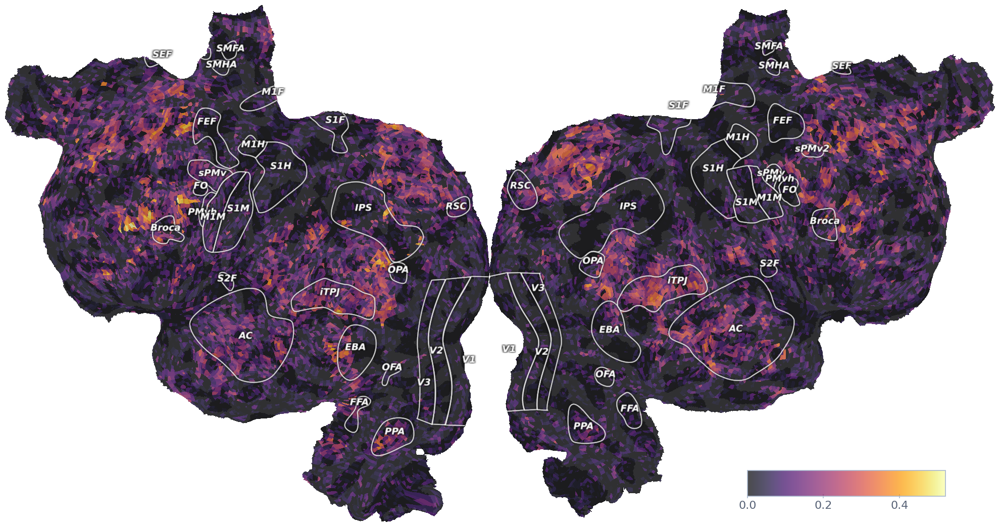

In [140]:
plot_flatmap_from_mapper(residual_correlation, mapper_path, vmin=0,
                         vmax=np.max(residual_correlation),
                         colorbar_location=[0.75, 0.05, 0.2, 0.05])

plt.show()

### Ridge

In [141]:
residual_ridge_file = os.path.join(get_result_path(modality, subject),
                                   f"residual_ridge_{low_level_feature}_english1000_scores.csv")

In [142]:
residual_ridge_scores = pd.read_csv(residual_ridge_file)
residual_ridge_scores.describe()

,Unnamed: 0,correlation_score,r2_score,p_value
count,80615.000000,80069.000000,80615.000000,8.006900e+04
mean,40307.000000,0.030413,0.002633,3.947241e-01
std,23271.690312,0.092658,0.017513,3.144010e-01
min,0.000000,-0.330847,-0.149948,2.032921e-23
25%,20153.500000,-0.030661,-0.000499,9.398494e-02
50%,40307.000000,0.020658,0.000000,3.518336e-01
75%,60460.500000,0.079246,0.001113,6.660624e-01
max,80614.000000,0.539920,0.227783,9.999300e-01


In [143]:
residual_ridge_correlation = residual_ridge_scores['correlation_score']
residual_ridge_correlation = residual_ridge_correlation.to_numpy()
residual_ridge_correlation = np.nan_to_num(residual_ridge_correlation)

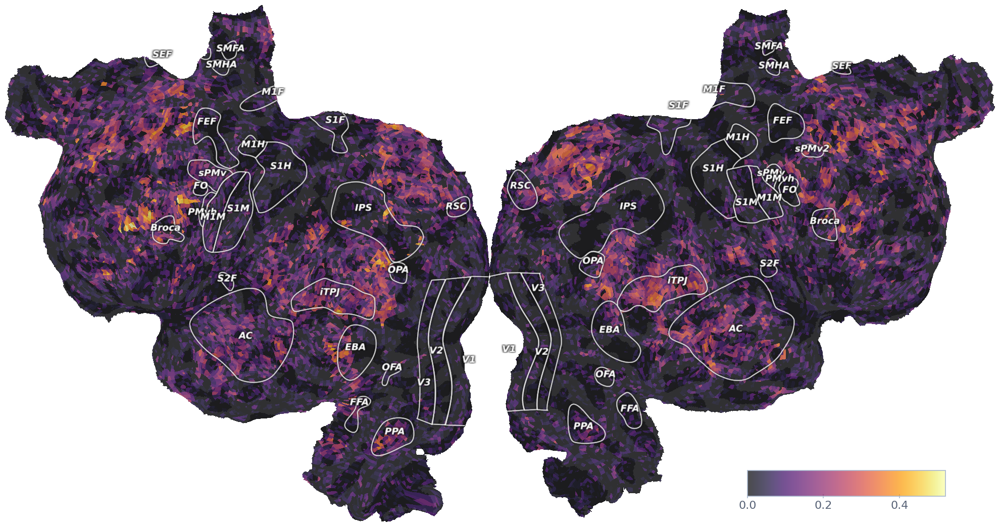

In [144]:
plot_flatmap_from_mapper(residual_correlation, mapper_path, vmin=0,
                         vmax=np.max(residual_correlation),
                         colorbar_location=[0.75, 0.05, 0.2, 0.05])

plt.show()

13


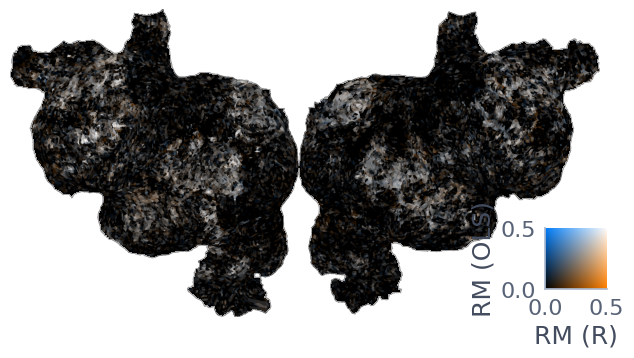

In [145]:
from matplotlib.ticker import FormatStrFormatter

fig, ax = plt.subplots(1, 1, figsize=(8, 4))

ax.axis('off')

vmin = 0
vmax = max(residual_ridge_correlation.max(), residual_correlation.max())
plot_2d_flatmap_from_mapper(residual_ridge_correlation, residual_correlation, mapper_path, vmin=vmin, vmax=vmax,
                            vmin2=vmin,
                            vmax2=vmax, alpha=1, label_1='RM (R)', label_2="RM (OLS)", ax=ax, with_rois=False,
                            colorbar_location=[0.86, 0.09, 0.2, 0.2])
# get child axis
children = ax.get_children()
print(len(children))
cbar = children[11]
# set formatter
cbar.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
cbar.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

13
13
13


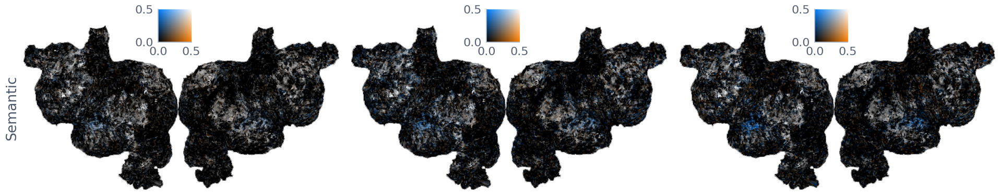

In [146]:
from matplotlib.ticker import FormatStrFormatter

figsize = np.array(flatmap_mask.shape) / 100.
fig, axs = plt.subplots(1, 3, figsize=figsize)

vmin = 0
vmax = max(np.nan_to_num(vp_correlation).max(), residual_correlation.max())
for i, (ax, corr, name) in enumerate(
        zip(axs, [residual_ridge_correlation, residual_correlation, vp_correlation],
            ["Residual Method (Ridge)", "Residual Method (OLS)", "Variance Partitioning"])):
    plot_2d_flatmap_from_mapper(corr, semantic_correlation, mapper_path, vmin=vmin, vmax=vmax, vmin2=vmin,
                                vmax2=vmax, alpha=1, label_1="", label_2="", ax=ax, with_rois=False,
                                colorbar_location=[0.38, 0.9, 0.2, 0.2])

    ax.axis('off')
    ax.set_xlabel(name)

    # get child axis
    children = ax.get_children()
    print(len(children))
    cbar = children[11]
    # set formatter
    cbar.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    cbar.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
fig.supylabel("Semantic")
plt.tight_layout()

# Plot visual cortex side by side

/tmp/ipykernel_11636/4203059752.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


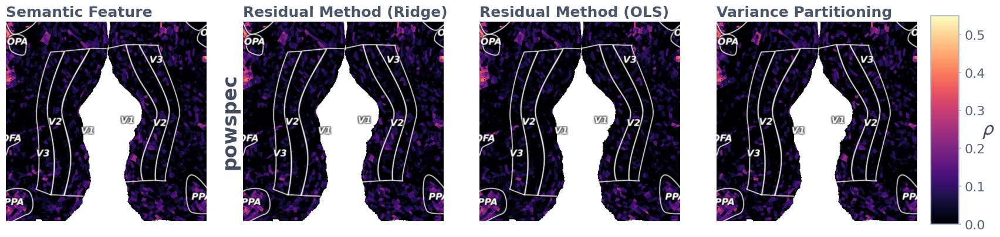

In [147]:
viewport_size = 400
fig, axs = plt.subplots(1, 4, figsize=(viewport_size / 100 * 4, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max(),
           residual_ridge_correlation.max())

cmap = 'magma'
alpha = 1
width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2 - 25

for i, (corr, name) in enumerate(
        zip([semantic_correlation, residual_ridge_correlation, residual_correlation, vp_correlation],
            ["Semantic Feature", "Residual Method (Ridge)", "Residual Method (OLS)", "Variance Partitioning"])):
    ax = axs[i]

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])  # Remove x ticks
    ax.set_yticks([])  # Remove y ticks
    ax.set_xlim([hcenter - viewport_size / 2, hcenter + viewport_size / 2])
    ax.set_ylim([vcenter + viewport_size / 2, vcenter - viewport_size / 2])
    ax.set_title(name)
    plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap, alpha=alpha)

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
# cbar.ax.set_title(r"$\rho$", fontsize=26)
cbar.set_label(r"$\rho$", fontsize=26,
               rotation='horizontal')

axs[1].set_ylabel(low_level_feature, weight='bold', fontsize=24)
plt.tight_layout()
plt.show()

# Plot auditory cortex side-by-side

/tmp/ipykernel_11636/437264747.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


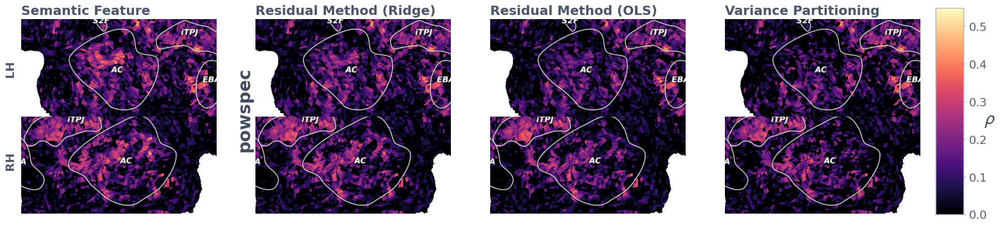

In [148]:
viewport_size = 450
fig, axs = plt.subplots(2, 4, figsize=(viewport_size / 100 * 4, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max(),
           residual_ridge_correlation.max())

cmap = 'magma'
alpha = 1

width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

left_ac = hcenter - 500
right_ac = hcenter + 450
vac = 650

for row, ac in enumerate([left_ac, right_ac]):
    for col, (corr, name) in enumerate(
            zip([semantic_correlation, residual_ridge_correlation, residual_correlation, vp_correlation],
                ["Semantic Feature", "Residual Method (Ridge)", "Residual Method (OLS)", "Variance Partitioning"])):
        ax = axs[row, col]

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks

        ax.set_xlim([ac - viewport_size / 2, ac + viewport_size / 2])
        ax.set_ylim([vac + viewport_size / 4, vac - viewport_size / 4])

        if row == 0:
            ax.set_title(name)

        plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap,
                                 alpha=alpha)

fig.text(0, .65, "LH", rotation=90, horizontalalignment='left', weight='bold')
fig.text(0, .25, "RH", rotation=90, horizontalalignment='left', weight='bold')

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
cbar.set_label(r"$\rho$", fontsize=26, rotation='horizontal', loc='center')

axs[0,1].set_ylabel(low_level_feature, weight='bold', fontsize=24,ha="right")
plt.tight_layout()
plt.subplots_adjust(hspace=0)
plt.show()